In [8]:
import cv2 as cv
from google.colab.patches import cv2_imshow
import numpy as np
import matplotlib.pyplot as plt


## Task 1:
1. Increase the size of the image.
2. Rotate the image by 120 degrees.
3. Perform Sheer operations over the image.


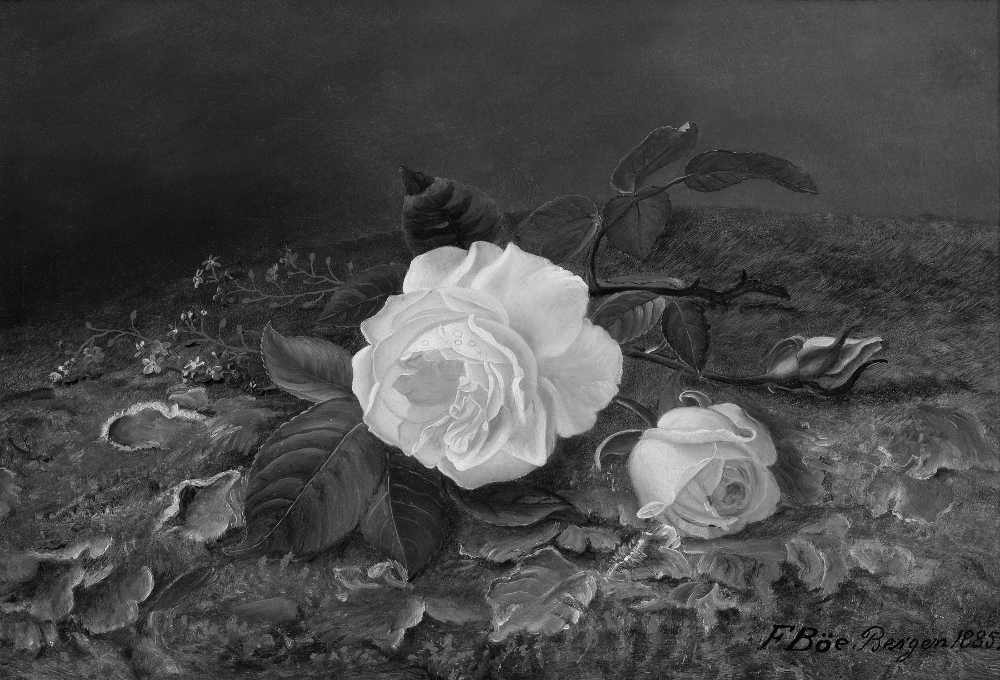

In [36]:
img = cv.imread('/content/Yellow-Roses-(1885).jpg', 0)  # 0 for grayscale
rows, cols = img.shape

# Scale factor (e.g., 1.5x larger)
scale = 2.5
new_cols = int(cols * scale)
new_rows = int(rows * scale)

# Resize the image
img_resized = cv.resize(img, (new_cols, new_rows), interpolation=cv.INTER_LINEAR)

cv2_imshow(img_resized)

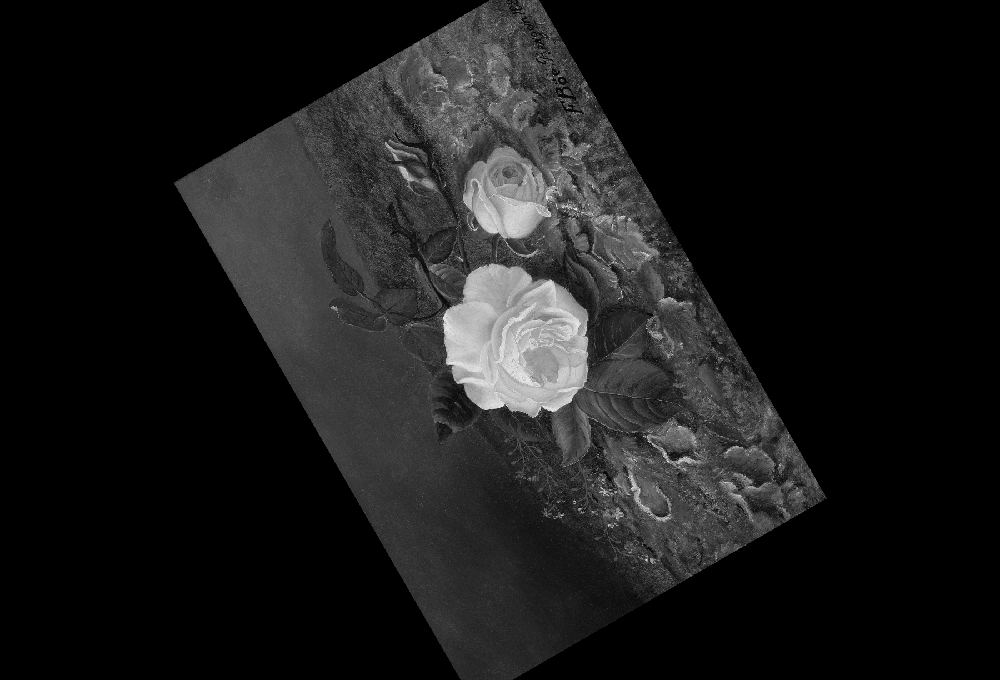

In [17]:
# 1.2 Rotate the image by 120 degrees.

img = cv.imread('/content/Yellow-Roses-(1885).jpg', 0) # 0 for gray only
rows, cols = img.shape
M = np.float32([[1,  0, 0], [0, -1, rows], [0,  0, 1]])
img_rotation = cv.warpAffine(img,
                             cv.getRotationMatrix2D((cols/2, rows/2),
                                                    120, 0.6), # 120 is the degrees
                             (cols, rows))
cv2_imshow( img_rotation)
cv.imwrite('rotation_out.jpg', img_rotation)
cv.waitKey(0)
cv.destroyAllWindows()

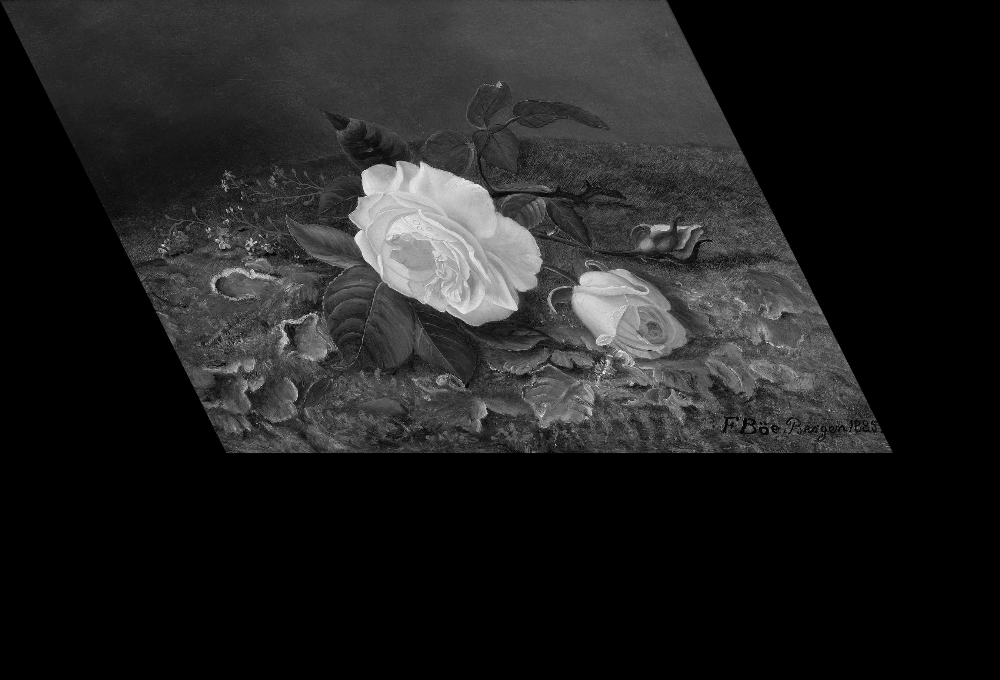

In [37]:
# 1.3 Perform Sheer operations over the image.


# Image Shearing in X-Axis
img = cv.imread('/content/Yellow-Roses-(1885).jpg', 0) # 0 for gray only
rows, cols = img.shape
M = np.float32([[1, 0.5, 0], [0, 1, 0], [0, 0, 1]])
sheared_img = cv.warpPerspective(img, M, (int(cols*1.5), int(rows*1.5)))
cv2_imshow(sheared_img)
cv.waitKey(0)
cv.destroyAllWindows()



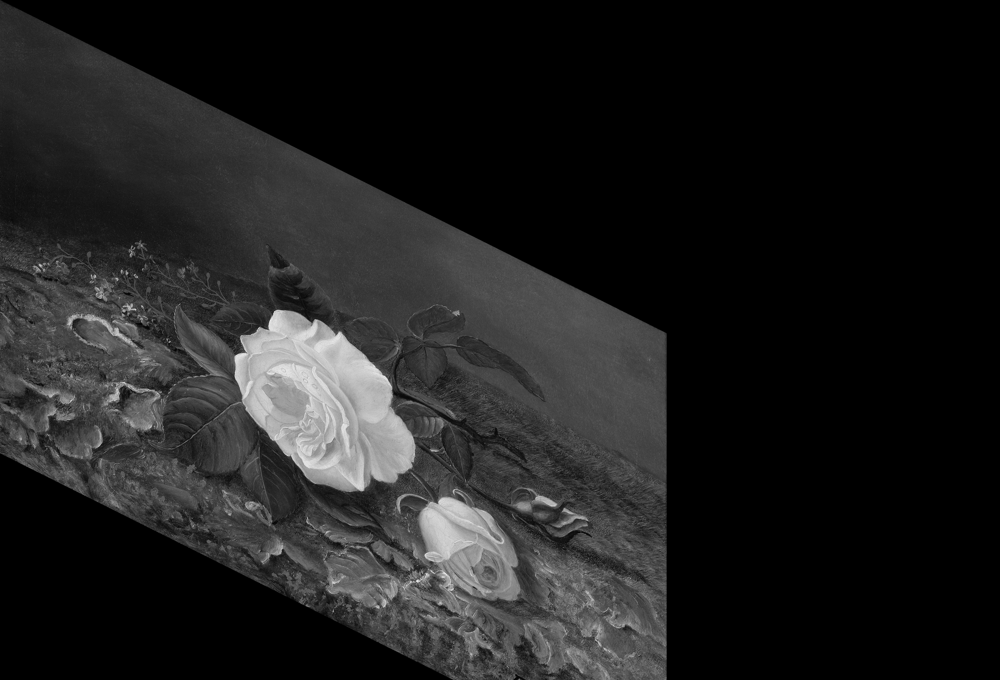

In [26]:
# Image Shearing in Y-Axis

img = cv.imread('/content/Yellow-Roses-(1885).jpg', 0) # 0 for gray only
rows, cols = img.shape
M = np.float32([[1,   0, 0], [0.5, 1, 0], [0,   0, 1]])
sheared_img = cv.warpPerspective(img, M, (int(cols*1.5), int(rows*1.5)))
cv2_imshow( sheared_img)
cv.waitKey(0)
cv.destroyAllWindows()

## Task2: Use any image processing library and apply the following intensity
transformations over the image.
1. Negative
2. Log with (choose an appropriate constant for your image)
3. Power law (choose a value for gamma that increases the contrast)

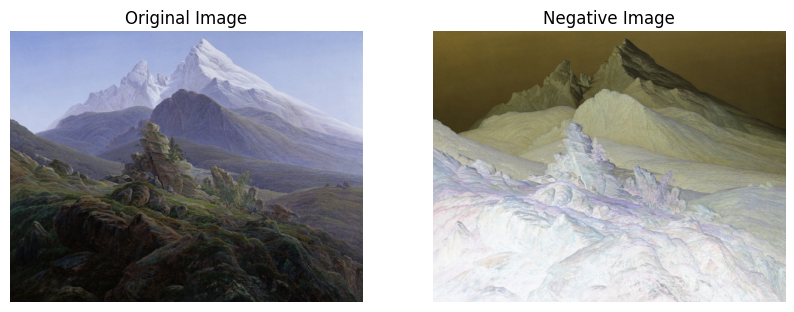

In [28]:
#2.1 Negative transformation

original_image = cv.imread("/content/The-Watzmann.jpg")

# Perform the negative transformation
negative_image = 256 - 1 - original_image

# Display the original and negative images side by side
plt.figure(figsize=(10, 5))  # Create a figure with a specified size
plt.subplot(1, 2, 1)  # Subplot for the original image
plt.imshow(cv.cvtColor(original_image, cv.COLOR_BGR2RGB))
plt.title("Original Image")
plt.axis('off')  # Turn off axis labels

plt.subplot(1, 2, 2)  # Subplot for the negative image
plt.imshow(cv.cvtColor(negative_image, cv.COLOR_BGR2RGB))
plt.title("Negative Image")
plt.axis('off')

plt.show()  # Show the figure with both images

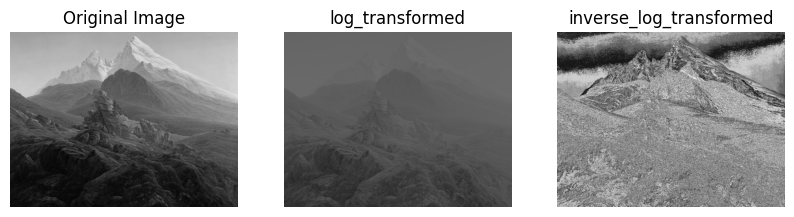

In [30]:
#2.2 Log

# Load an image
image = cv.imread("/content/The-Watzmann.jpg", cv.IMREAD_GRAYSCALE)
# Log Transformation
c = 20
log_transformed = c * (np.log(image + 1))

# Convert to 8-bit unsigned integer format
log_transformed = np.uint8(log_transformed)

# Inverse-Log Transformation
inverse_log_transformed = c * (np.exp(log_transformed / c) - 1)

# Convert to 8-bit unsigned integer format
inverse_log_transformed = np.uint8(inverse_log_transformed)
# Display the original and negative images side by side
plt.figure(figsize=(10, 5))  # Create a figure with a specified size
plt.subplot(1, 3, 1)  # Subplot for the original image
plt.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))
plt.title("Original Image")
plt.axis('off')  # Turn off axis labels

plt.subplot(1, 3, 2)
plt.imshow(cv.cvtColor(log_transformed, cv.COLOR_BGR2RGB))
plt.title("log_transformed")
plt.axis('off')
plt.subplot(1, 3, 3)
plt.imshow(cv.cvtColor(inverse_log_transformed, cv.COLOR_BGR2RGB))
plt.title("inverse_log_transformed")
plt.axis('off')
plt.show()

(np.float64(-0.5), np.float64(1799.5), np.float64(1382.5), np.float64(-0.5))

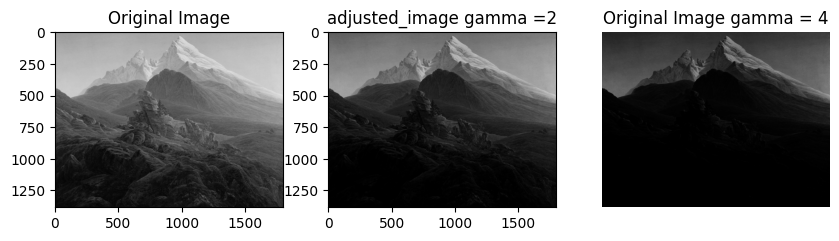

In [32]:
#2.3

# Read an image
image = cv.imread("/content/The-Watzmann.jpg", cv.IMREAD_GRAYSCALE)

# Apply gamma correction (e.g., gamma = 1.5)
gamma = 2
gamma2=4
adjusted_image = np.power(image / 255.0, gamma) * 255.0
adjusted_image = adjusted_image.astype(np.uint8)
adjusted_image2 = np.power(image / 255.0, gamma2) * 255.0
adjusted_image2 = adjusted_image2.astype(np.uint8)
plt.figure(figsize=(10, 5))  # Create a figure with a specified size
plt.subplot(1, 3, 2)  # Subplot for the original image
plt.imshow(cv.cvtColor(adjusted_image, cv.COLOR_BGR2RGB))
plt.title("adjusted_image gamma =2")

plt.subplot(1, 3, 1)  # Subplot for the original image
plt.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))
plt.title("Original Image")

plt.subplot(1, 3, 3)  # Subplot for the original image
plt.imshow(cv.cvtColor(adjusted_image2, cv.COLOR_BGR2RGB))
plt.title("Original Image gamma = 4")
plt.axis('off')